In [1]:
import torch
import numpy as np
from torch.utils.data import DataLoader, Subset
from torch.optim import Adam
from torch.nn import MSELoss
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from tqdm import tqdm

from src.dataset import PropertyDataset
from src.model import MultiModalRegressor


In [2]:
DATA_PATH = "data/train.csv"
IMAGE_DIR = "data/images/train"

FEATURES = ['sqft_living', 'grade', 'sqft_above', 'sqft_living15', 'bathrooms', 'view', 'sqft_basement', 'bedrooms', 'floors', 'waterfront', 'yr_renovated', 'sqft_lot', 'sqft_lot15', 'yr_built', 'condition']

BATCH_SIZE = 32
EPOCHS = 10
LR = 1e-4
RANDOM_STATE = 42

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [3]:
base_dataset = PropertyDataset(
    DATA_PATH, IMAGE_DIR, FEATURES, scaler=None, train=True
)


In [4]:
indices = np.arange(len(base_dataset))
train_idx, val_idx = train_test_split(
    indices, test_size=0.2, random_state=RANDOM_STATE
)


In [5]:
scaler = StandardScaler()
train_df = base_dataset.df.iloc[train_idx]
scaler.fit(train_df[FEATURES])


StandardScaler()

In [6]:
full_dataset = PropertyDataset(
    DATA_PATH, IMAGE_DIR, FEATURES, scaler=scaler, train=True
)

train_dataset = Subset(full_dataset, train_idx)
val_dataset   = Subset(full_dataset, val_idx)


In [7]:
train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2
)

val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2
)


In [8]:
model = MultiModalRegressor(tabular_dim=len(FEATURES)).to(device)
optimizer = Adam(model.parameters(), lr=LR)
criterion = MSELoss()


c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [9]:
best_val_rmse = float("inf")
patience = 2          # how many bad epochs to tolerate
patience_counter = 0

CHECKPOINT_PATH = "outputs/best_model.pth"  


In [10]:
for epoch in range(EPOCHS):
    # ---- TRAIN ----
    model.train()
    train_losses = []

    for img, tab, y in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [TRAIN]"):
        img, tab, y = img.to(device), tab.to(device), y.to(device)

        optimizer.zero_grad()
        preds = model(img, tab)
        loss = criterion(preds, y)
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # ---- VALIDATION ----
    model.eval()
    val_preds, val_targets = [], []

    with torch.no_grad():
        for img, tab, y in tqdm(val_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [VAL]", leave=False):
            img, tab, y = img.to(device), tab.to(device), y.to(device)
            preds = model(img, tab)
            val_preds.append(preds.cpu().numpy())
            val_targets.append(y.cpu().numpy())

    val_preds = np.concatenate(val_preds)
    val_targets = np.concatenate(val_targets)

    rmse = mean_squared_error(val_targets, val_preds)
    r2 = r2_score(val_targets, val_preds)

    print(
        f"\nEpoch {epoch+1} Summary\n"
        f"Train MSE: {np.mean(train_losses):.4f}\n"
        f"Val RMSE:  {rmse:.4f}\n"
        f"Val R²:    {r2:.4f}\n"
    )

    # ----- EARLY STOPPING LOGIC -----
    if rmse < best_val_rmse:
        best_val_rmse = rmse
        patience_counter = 0

        torch.save(model.state_dict(), CHECKPOINT_PATH)
        print(f"New best model saved (Val RMSE = {rmse:.4f})")

    else:
        patience_counter += 1
        print(f"No improvement ({patience_counter}/{patience})")

        if patience_counter >= patience:
            print("Early stopping triggered")
            break


Epoch 1/10 [TRAIN]: 100%|██████████| 406/406 [17:39<00:00,  2.61s/it]



Epoch 1 Summary
Train MSE: 15.8688
Val RMSE:  0.1660
Val R²:    0.3985

New best model saved (Val RMSE = 0.1660)


Epoch 2/10 [TRAIN]: 100%|██████████| 406/406 [16:18<00:00,  2.41s/it]



Epoch 2 Summary
Train MSE: 0.1343
Val RMSE:  0.1153
Val R²:    0.5823

New best model saved (Val RMSE = 0.1153)


Epoch 3/10 [TRAIN]: 100%|██████████| 406/406 [16:41<00:00,  2.47s/it]



Epoch 3 Summary
Train MSE: 0.0980
Val RMSE:  0.1026
Val R²:    0.6280

New best model saved (Val RMSE = 0.1026)


Epoch 4/10 [TRAIN]: 100%|██████████| 406/406 [22:21<00:00,  3.31s/it]



Epoch 4 Summary
Train MSE: 0.0812
Val RMSE:  0.0962
Val R²:    0.6514

New best model saved (Val RMSE = 0.0962)


Epoch 5/10 [TRAIN]: 100%|██████████| 406/406 [17:33<00:00,  2.59s/it]



Epoch 5 Summary
Train MSE: 0.0665
Val RMSE:  0.0867
Val R²:    0.6860

New best model saved (Val RMSE = 0.0867)


Epoch 6/10 [TRAIN]: 100%|██████████| 406/406 [17:58<00:00,  2.66s/it]



Epoch 6 Summary
Train MSE: 0.0569
Val RMSE:  0.0881
Val R²:    0.6806

No improvement (1/2)


Epoch 7/10 [TRAIN]: 100%|██████████| 406/406 [20:54<00:00,  3.09s/it]



Epoch 7 Summary
Train MSE: 0.0476
Val RMSE:  0.0848
Val R²:    0.6928

New best model saved (Val RMSE = 0.0848)


Epoch 8/10 [TRAIN]: 100%|██████████| 406/406 [21:44<00:00,  3.21s/it]



Epoch 8 Summary
Train MSE: 0.0423
Val RMSE:  0.0925
Val R²:    0.6646

No improvement (1/2)


Epoch 9/10 [TRAIN]: 100%|██████████| 406/406 [16:20<00:00,  2.42s/it]
                                                                   


Epoch 9 Summary
Train MSE: 0.0382
Val RMSE:  0.0911
Val R²:    0.6700

No improvement (2/2)
Early stopping triggered


In [ ]:
model.load_state_dict(torch.load("outputs/best_model.pth"))
model.eval()


MultiModalRegressor(
  (image_encoder): ImageEncoder(
    (backbone): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): B

MOVING ON WITH THE BEST MODEL TO GRAD CAM

In [3]:
import torch
from src.model import MultiModalRegressor

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
FEATURES = ['sqft_living', 'grade', 'sqft_above', 'sqft_living15', 'bathrooms', 'view', 'sqft_basement', 'bedrooms', 'floors', 'waterfront', 'yr_renovated', 'sqft_lot', 'sqft_lot15', 'yr_built', 'condition']

model = MultiModalRegressor(tabular_dim=len(FEATURES)).to(device)
model.load_state_dict(torch.load("outputs/best_model.pth"))
model.eval()

c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MultiModalRegressor(
  (image_encoder): ImageEncoder(
    (backbone): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): B

In [57]:
target_layer = model.image_encoder.backbone[-3]

80, 67, 0, 69

In [71]:
from src.gradcam import GradCAM
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt

# Load one validation sample
image, tabular, _ = val_dataset[69]
image = image.unsqueeze(0).to(device)
tabular = tabular.unsqueeze(0).to(device)

gradcam = GradCAM(model, target_layer)
cam = gradcam.generate(image, tabular)


c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torch\nn\modules\module.py:1866: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


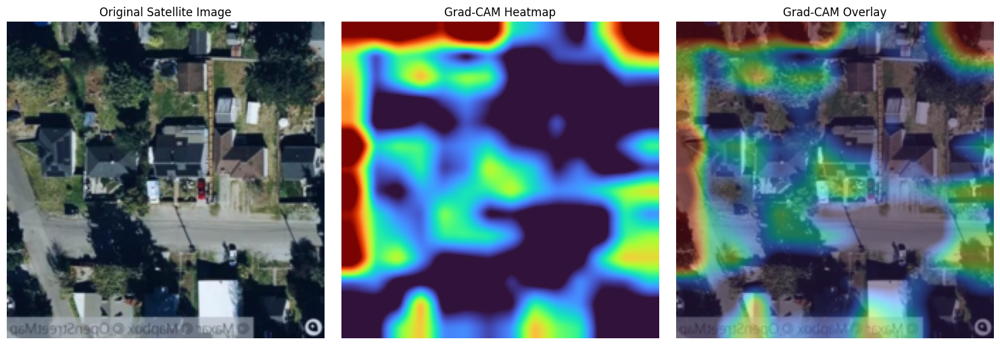

In [72]:
from src.gradcam import overlay_cam
import cv2
image_np = image[0].permute(1, 2, 0).cpu().numpy()
image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())

heatmap = cv2.applyColorMap(
    np.uint8(255 * cam),
    cv2.COLORMAP_JET
)
heatmap = heatmap / 255.0

# overlay = 0.4 * heatmap + 0.6 * image_np
# overlay = overlay / overlay.max()

cam = np.clip(cam, np.percentile(cam, 30), np.percentile(cam, 95))
cam = (cam - cam.min()) / (cam.max() - cam.min())


overlay = overlay_cam(image_np, cam, alpha=0.45)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(image_np)
axes[0].set_title("Original Satellite Image")
axes[0].axis("off")

axes[1].imshow(cam, cmap="turbo")
axes[1].set_title("Grad-CAM Heatmap")
axes[1].axis("off")

axes[2].imshow(overlay)
axes[2].set_title("Grad-CAM Overlay")
axes[2].axis("off")

plt.tight_layout()
plt.show()



Comparing High and Low Price Grad Cams


In [73]:
import numpy as np

df = full_dataset.df.copy()

# Compute price percentiles
low_thresh  = np.percentile(df["price"], 15)
high_thresh = np.percentile(df["price"], 85)

low_idx  = df[df["price"] <= low_thresh].index
high_idx = df[df["price"] >= high_thresh].index

# Pick a few examples
low_examples  = np.random.choice(low_idx, size=3, replace=False)
high_examples = np.random.choice(high_idx, size=3, replace=False)

low_examples, high_examples


(array([14165,  5569,  1850]), array([11897,  4515, 10412]))

In [74]:
def gradcam_for_index(idx):
    image, tabular, _ = full_dataset[idx]

    image = image.unsqueeze(0).to(device)
    tabular = tabular.unsqueeze(0).to(device)

    cam = gradcam.generate(image, tabular)

    image_np = image[0].permute(1, 2, 0).cpu().numpy()
    image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())

    overlay = overlay_cam(image_np, cam, alpha=0.4)

    return image_np, cam, overlay


HIGH PRICE EXAMPLES


c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torch\nn\modules\module.py:1866: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torch\nn\modules\module.py:1866: FutureWarning: Using a non-full backward hook when the forward contai

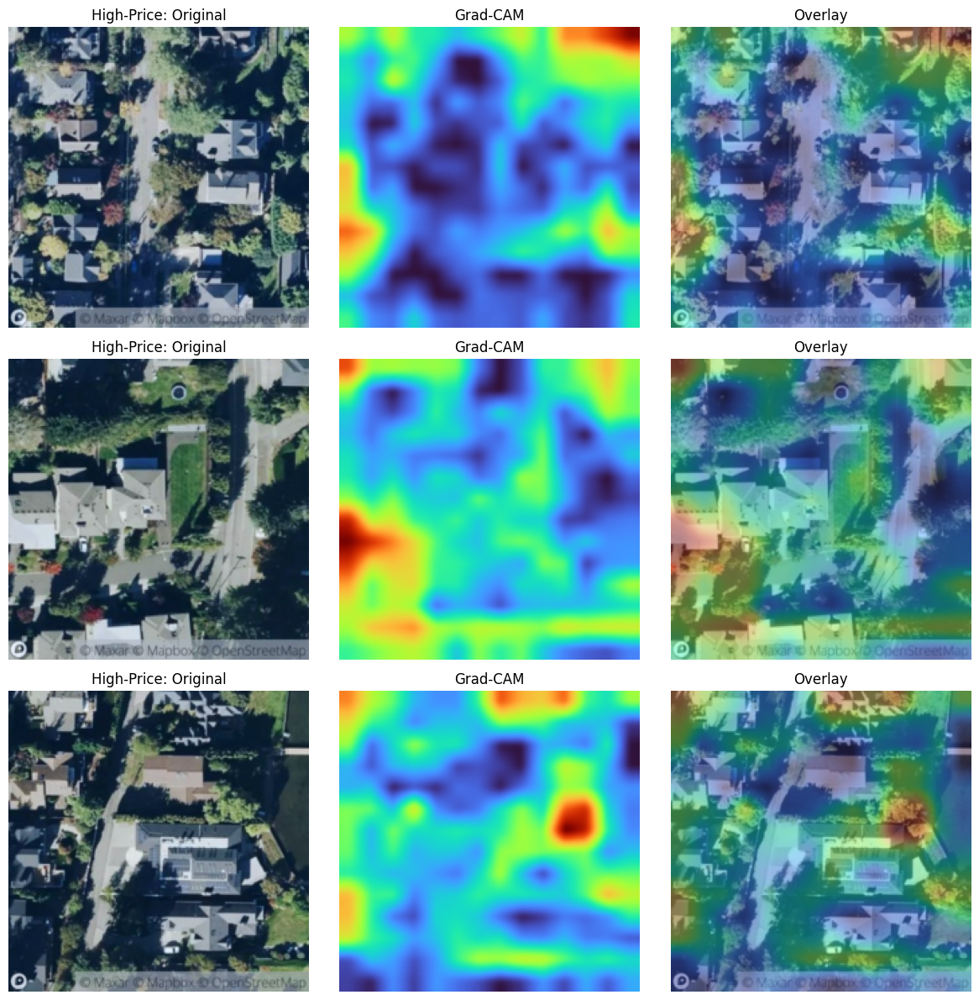

In [75]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(high_examples), 3, figsize=(12, 4*len(high_examples)))

for i, idx in enumerate(high_examples):
    img, cam, overlay = gradcam_for_index(idx)

    axes[i,0].imshow(img)
    axes[i,0].set_title("High-Price: Original")
    axes[i,0].axis("off")

    axes[i,1].imshow(cam, cmap="turbo")
    axes[i,1].set_title("Grad-CAM")
    axes[i,1].axis("off")

    axes[i,2].imshow(overlay)
    axes[i,2].set_title("Overlay")
    axes[i,2].axis("off")

plt.tight_layout()
plt.show()


c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torch\nn\modules\module.py:1866: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\envs\multimodal\lib\site-packages\torch\nn\modules\module.py:1866: FutureWarning: Using a non-full backward hook when the forward contai

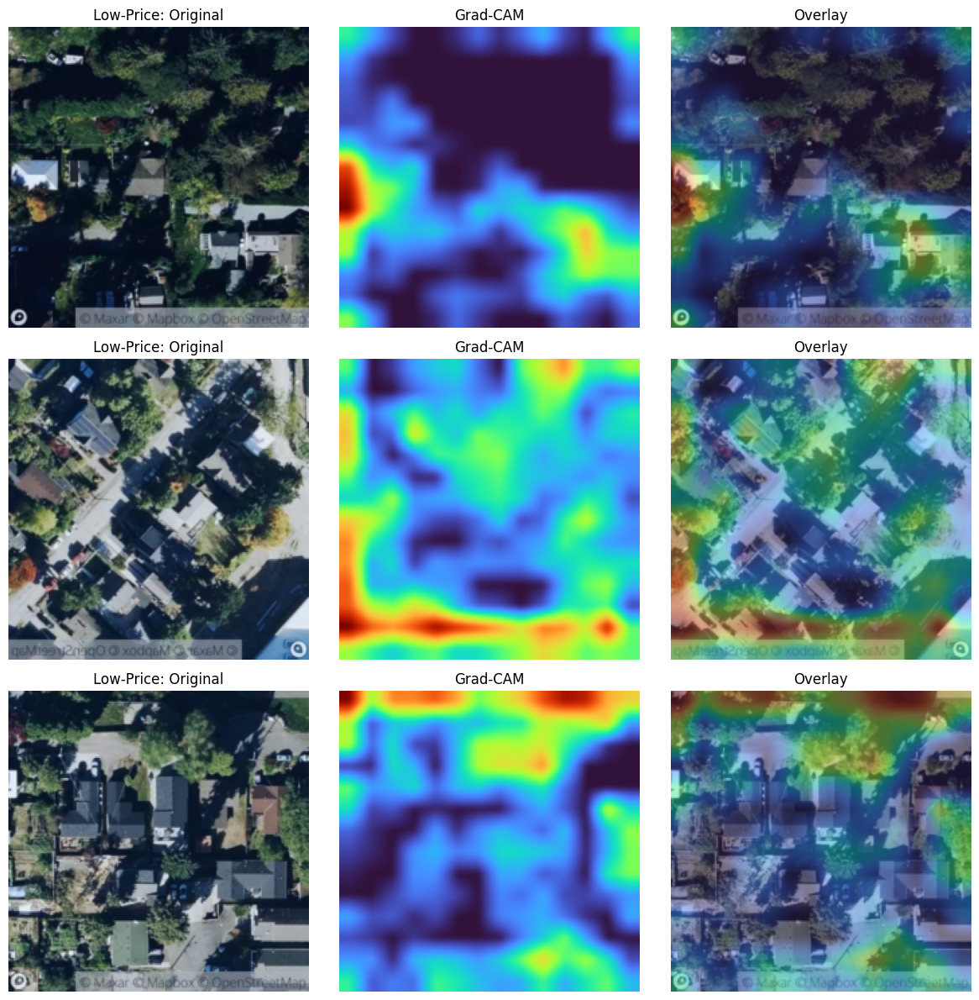

In [76]:
fig, axes = plt.subplots(len(low_examples), 3, figsize=(12, 4*len(low_examples)))

for i, idx in enumerate(low_examples):
    img, cam, overlay = gradcam_for_index(idx)

    axes[i,0].imshow(img)
    axes[i,0].set_title("Low-Price: Original")
    axes[i,0].axis("off")

    axes[i,1].imshow(cam, cmap="turbo")
    axes[i,1].set_title("Grad-CAM")
    axes[i,1].axis("off")

    axes[i,2].imshow(overlay)
    axes[i,2].set_title("Overlay")
    axes[i,2].axis("off")

plt.tight_layout()
plt.show()


In [8]:
import torch
from src.model import MultiModalRegressor
FEATURES = ['sqft_living', 'grade', 'sqft_above', 'sqft_living15', 'bathrooms', 'view', 'sqft_basement', 'bedrooms', 'floors', 'waterfront', 'yr_renovated', 'sqft_lot', 'sqft_lot15', 'yr_built', 'condition']
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = MultiModalRegressor(tabular_dim=len(FEATURES)).to(device)
model.load_state_dict(torch.load("outputs/best_model.pth"))
model.eval()

# Freeze everything
for p in model.parameters():
    p.requires_grad = False

c:\Users\aryn3\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\aryn3\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [11]:
from tqdm import tqdm
import numpy as np


In [12]:
def extract_embeddings(dataset, model):
    embeddings = []
    tabular_feats = []
    targets = []

    model.eval()

    with torch.no_grad():
        for i in tqdm(
            range(len(dataset)),
            desc="Extracting CNN embeddings",
            unit="samples"
        ):
            img, tab, y = dataset[i]

            img = img.unsqueeze(0).to(device)

            # CNN forward pass
            img_feat = model.image_encoder(img)  # (1, 512)

            embeddings.append(img_feat.cpu().numpy().squeeze())
            tabular_feats.append(tab.numpy())
            targets.append(y.item())

    return (
        np.array(embeddings),
        np.array(tabular_feats),
        np.array(targets)
    )


In [13]:
X_img, X_tab, y = extract_embeddings(full_dataset, model)

X_hybrid = np.hstack([X_tab, X_img])

print("Hybrid feature matrix shape:", X_hybrid.shape)


Extracting CNN embeddings:   0%|          | 0/16209 [00:00<?, ?samples/s]c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
Extracting CNN embeddings:   0%|          | 1/16209 [00:00<29:40,  9.10samples/s]c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
Extracting CNN embeddings:   0%|          | 2/16209 [00:00<31:17,  8.63samples/s]c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
Extracting CNN embeddings:   0%|          | 4

Hybrid feature matrix shape: (16209, 527)


In [14]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X_hybrid, y, test_size=0.2, random_state=42
)


In [15]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

xgb = XGBRegressor(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="reg:squarederror",
    random_state=42
)

xgb.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=None, num_parallel_tree=None, ...)

In [16]:
preds = xgb.predict(X_val)

rmse = mean_squared_error(y_val, preds, squared=False)
r2 = r2_score(y_val, preds)

rmse, r2


(0.261621022488267, 0.7519672397572427)

GENERATING PREDICTION CSV

In [17]:
import torch
import numpy as np
import pandas as pd

from src.model import MultiModalRegressor

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

cnn_model = MultiModalRegressor(tabular_dim=len(FEATURES)).to(device)
cnn_model.load_state_dict(torch.load("outputs/best_model.pth"))
cnn_model.eval()

# Freeze CNN
for p in cnn_model.parameters():
    p.requires_grad = False


c:\Users\aryn3\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\aryn3\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [18]:
from src.dataset import PropertyDataset

test_dataset = PropertyDataset(
    data_path="data/test.csv",
    image_dir="data/images/test",
    features=FEATURES,
    scaler=scaler,          # SAME scaler as training
    train=False
)


In [19]:
def extract_test_features(dataset, model):
    img_embeddings = []
    tabular_feats = []
    ids = []

    with torch.no_grad():
        for i in range(len(dataset)):
            image, tabular = dataset[i]

            image = image.unsqueeze(0).to(device)

            img_feat = model.image_encoder(image)  # (1, 512)

            img_embeddings.append(img_feat.cpu().numpy().squeeze())
            tabular_feats.append(tabular.numpy())
            ids.append(dataset.df.iloc[i]["id"])

    return (
        np.array(ids),
        np.hstack([np.array(tabular_feats), np.array(img_embeddings)])
    )


In [20]:
test_ids, X_test_hybrid = extract_test_features(test_dataset, cnn_model)


c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\aryn3\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid f

In [21]:
# xgb is your trained hybrid model
log_preds = xgb.predict(X_test_hybrid)


In [22]:
price_preds = np.expm1(log_preds)


In [23]:
submission = pd.DataFrame({
    "id": test_ids,
    "predicted_price": price_preds
})

submission.to_csv("outputs/final_predictions.csv", index=False)
